# Denoising Model Architecture and Training Setup



## 1. Architecture

The core architecture is a combination of a **pre-trained encoder** with an attention-based **U-Net decoder** for image denoising. Below are the components and their functions:

### 1.1 Overview of U-Net with Attention
The architecture is based on an **Attention U-Net** structure with a pre-trained encoder. It combines the effective segmentation power of the traditional U-Net with advanced attention mechanisms to focus on critical regions.

### 1.2 Key Components in Detail

#### Encoder (Feature Extraction)
- The encoder is responsible for **extracting features** from the input image at multiple levels of abstraction.
- Popular encoders used:
  - **ResNet** (e.g., `resnet34`):
    - Uses convolutional blocks with residual connections.
    - **Residual Connections** prevent vanishing gradients, allowing deeper networks to learn efficiently.
  - **EfficientNet** (e.g., `efficientnet-b0`, `efficientnet-b3`):
    - Uses **compound scaling** to balance depth, width, and resolution for efficient performance.
    - Achieves high accuracy with fewer parameters compared to traditional CNNs like ResNet.
- **Transfer Learning**:
  - The encoder is pre-trained on ImageNet, providing a strong baseline understanding of natural images.
  - Improves generalization on smaller datasets and speeds up convergence.

#### Skip Connections
- **Skip connections** bridge each corresponding level in the encoder and decoder, preserving spatial information from early layers during reconstruction.
- Crucial for preserving fine details and structural information.

#### Attention Mechanisms
- **SCSE (Spatial and Channel Squeeze & Excitation) Attention Block**:
  - **Channel Attention**: Focuses on relevant feature maps (channels).
  - **Spatial Attention**: Highlights specific regions within feature maps, ensuring important details are preserved.
  - Enhances the network’s sensitivity to important features, helping retain small defects during denoising.

#### Decoder (Image Reconstruction)
- The decoder reconstructs the denoised image from the multi-scale features extracted by the encoder.
- Uses:
  - **Transposed Convolutions** for upsampling.
  - **Concatenation** with skip connections for detail retention.
  - **Batch Normalization** for stable training.

#### Final Convolutional Layer
- A final **1x1 Convolution** layer maps the output to a standard RGB image (3 channels).
- Produces the final denoised image, closely matching the dimensions of the ground truth.

## 2. Handling Variable Image Sizes

### 2.1 Challenges with Variable Image Sizes
- Real-world datasets often have images of varying resolutions and aspect ratios.
- Resizing to a fixed size can reduce or distort critical features.

### 2.2 Adaptive Padding Approach
- Instead of resizing, **adaptive padding** is used:
  - **Padding** ensures images match the largest dimensions in a batch.
  - Maintains original aspect ratios and spatial details without distortion.
  - Zero-padding (`0` values) is used, avoiding artificial noise.

### 2.3 Custom Collate Function
- A custom `collate_fn` handles dynamic padding:
  - Determines the maximum width and height in each batch.
  - Pads each image to match these dimensions, preserving batch processing efficiency.

## 3. Dataset Management

### 3.1 Dataset Components
- **Degraded Images**: Noisy input images that need denoising.
- **Defect Masks**: Binary masks highlighting regions with critical defects.
- **Ground Truth**: Clean reference images used for supervised training.

### 3.2 Data Splitting
- Dataset is split into:
  - **Training Set (70%)**: Used to train the model.
  - **Validation Set (20%)**: Monitors performance during training.
  - **Test Set (10%)**: Evaluates final model performance.

### 3.3 Data Augmentation (Optional)
- Techniques like **random rotations, flipping, and brightness adjustments** can be added to enhance robustness to diverse noise patterns.
- Useful for increasing dataset size and variability.

## 4. Training Setup

### 4.1 Loss Function: Weighted Loss
- **Weighted Loss Function** to preserve important regions:
  - Base loss is **Mean Squared Error (MSE)**.
  - Gives higher weight to defect regions:
    - `Loss = MSE(non-masked areas) + weight * MSE(masked areas)`
  - Prevents oversmoothing critical details.

### 4.2 Optimizer: AdamW
- **AdamW** optimizer:
  - Variant of Adam with decoupled weight decay for better regularization.
  - Handles noisy gradients well and stabilizes convergence.
  - Weight decay set to `1e-5`.

### 4.3 Learning Rate Adjustment
- Initial learning rate set to `0.001`.
- **Scheduler (`ReduceLROnPlateau`)** adjusts the learning rate:
  - Monitors validation loss and reduces the rate when performance plateaus.
  - Helps avoid overfitting and ensures stable convergence.

## 5. Evaluation Metrics

### 5.1 Peak Signal-to-Noise Ratio (PSNR)
- **PSNR** is the primary metric for evaluating denoising quality:
  - A higher PSNR indicates better quality and closer reconstruction to the ground truth.
  - Calculated after every epoch for progress monitoring.
  - Final evaluation on the test set for generalization.

### 5.2 Visual Inspection
- Visual inspection alongside quantitative metrics:
  - Compare **Degraded Image**, **Mask**, **Ground Truth**, and **Model Output**.
  - Assess how well the model retains small defects while reducing noise.

## Summary
The architecture is a combination of a **pre-trained encoder** and an attention-enhanced U-Net decoder, tailored for **image denoising tasks with critical detail preservation**. The adaptive handling of variable image sizes ensures feature integrity, making the setup effective for complex denoising scenarios. Transfer learning and advanced attention mechanisms allow for good generalization, even with limited datasets, while providing visual and quantitative improvements over noisy inputs.

### Advantages of the Approach
- **Flexibility**: Choice between ResNet and EfficientNet for encoders.
- **Efficiency**: Leverages pre-trained networks for faster convergence.
- **Detail Preservation**: Uses attention mechanisms and weighted loss to retain critical tiny features.
- **Modularity**: Easily extendable for other restoration tasks like super-resolution or inpainting.

### Potential Improvements
- **Data Augmentation** to handle diverse noise patterns.
- Exploring **SSIM Loss** (Structural Similarity Index) for better perceptual quality.
- Using a **more advanced attention mechanism** (like Transformer-based attention) for finer control.

## References

### Key Papers

1. **U-Net: Convolutional Networks for Biomedical Image Segmentation**
   - **Authors**: Olaf Ronneberger, Philipp Fischer, Thomas Brox
   - **Link**: [arXiv:1505.04597](https://arxiv.org/abs/1505.04597)
   - **Summary**: This paper introduces the U-Net architecture, which has become a foundational model for various segmentation and image restoration tasks. It emphasizes the importance of skip connections for preserving spatial information, a core concept used in the current denoising architecture.
   - **Relevance**: The denoising model described uses a U-Net-based architecture with attention mechanisms for better feature retention.

2. **Attention U-Net: Learning Where to Look for the Pancreas**
   - **Authors**: Olaf Oktay, Jo Schlemper, et al.
   - **Link**: [arXiv:1804.03999](https://arxiv.org/abs/1804.03999)
   - **Summary**: This paper introduces an attention mechanism in the U-Net, allowing the network to focus on relevant regions in the image. It combines spatial and channel attention, enhancing the model's ability to handle fine details.
   - **Relevance**: The current model employs a similar approach by integrating attention mechanisms to emphasize important image regions.

3. **EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks**
   - **Authors**: Mingxing Tan, Quoc V. Le
   - **Link**: [arXiv:1905.11946](https://arxiv.org/abs/1905.11946)
   - **Summary**: EfficientNet introduces a method to scale neural networks using a compound scaling method. It achieves state-of-the-art performance while maintaining efficiency in terms of computational resources.
   - **Relevance**: EfficientNet serves as one of the encoder backbones, providing a highly efficient feature extractor for the denoising task.

4. **Squeeze-and-Excitation Networks**
   - **Authors**: Jie Hu, Li Shen, Samuel Albanie, Gang Sun, Enhua Wu
   - **Link**: [arXiv:1709.01507](https://arxiv.org/abs/1709.01507)
   - **Summary**: This paper introduces the concept of Squeeze-and-Excitation (SE) blocks, which recalibrate channel-wise feature responses through channel attention. This concept is extended in the SCSE (Spatial and Channel Squeeze & Excitation) blocks used in the current architecture.
   - **Relevance**: The attention mechanism used in the denoising model is based on similar SE blocks, specifically focusing on both spatial and channel attention.

5. **Image Restoration Using Very Deep Convolutional Encoder-Decoder Networks with Symmetric Skip Connections**
   - **Authors**: Ying Tai, Jian Yang, Xiaoming Liu
   - **Link**: [arXiv:1707.05479](https://arxiv.org/abs/1707.05479)
   - **Summary**: This paper discusses deep convolutional encoder-decoder networks with symmetric skip connections for image restoration tasks. It emphasizes the importance of deep feature extraction while retaining spatial information.
   - **Relevance**: The skip connections in the U-Net used for the denoising task are based on similar principles, aiming to maintain fine details throughout the network.

6. **Deep Residual Learning for Image Recognition**
   - **Authors**: Kaiming He, Xiangyu Zhang, Shaoqing Ren, Jian Sun
   - **Link**: [arXiv:1512.03385](https://arxiv.org/abs/1512.03385)
   - **Summary**: This paper introduces ResNet, a backbone used in many encoder-decoder architectures. It employs residual learning to ease the training of deep networks, which is critical in extracting robust features for tasks like denoising.
   - **Relevance**: The residual learning concept is foundational to the ResNet encoder option in the denoising architecture.

### Additional Resources
- **Segmentation Models Library**: A popular open-source library that provides access to pre-trained encoder-decoder models with attention mechanisms.
  - **GitHub**: [Segmentation Models](https://github.com/qubvel/segmentation_models.pytorch)
  - **Relevance**: This library supports the U-Net variants with attention mechanisms and provides access to EfficientNet and ResNet backbones, as used in the denoising model.



# Common Functions

In [12]:
import sys
sys.path.append('/root/DWDP')

In [13]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
import segmentation_models_pytorch as smp
from torchvision import transforms
from PIL import Image
from math import log10
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np




In [3]:
 # Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [10]:
class AttentionUNet(nn.Module):
    def __init__(self, encoder_name='resnet34', pretrained=True):
        super(AttentionUNet, self).__init__()
        # Use a pre-trained encoder (either ResNet or EfficientNet)
        self.model = smp.Unet(
            encoder_name=encoder_name,        # Choose the encoder ('resnet34', 'efficientnet-b3', etc.)
            encoder_weights='imagenet' if pretrained else None,  # Use ImageNet weights if pretrained
            in_channels=3,                    # Number of input channels (RGB images)
            classes=3,                        # Number of output channels (RGB output)
            decoder_attention_type='scse'     # Use spatial and channel-wise attention
        )
        
    def forward(self, x):
        return self.model(x)

In [4]:
# Custom Dataset Class
class DenoisingDataset(Dataset):
    def __init__(self, degraded_folder, mask_folder, ground_truth_folder, transform=None):
        self.degraded_images = sorted([os.path.join(degraded_folder, img) for img in os.listdir(degraded_folder)])
        self.masks = sorted([os.path.join(mask_folder, img) for img in os.listdir(mask_folder)])
        self.ground_truths = sorted([os.path.join(ground_truth_folder, img) for img in os.listdir(ground_truth_folder)])
        self.transform = transform

    def __len__(self):
        return len(self.degraded_images)

    def __getitem__(self, idx):
        degraded_img = Image.open(self.degraded_images[idx]).convert('RGB')
        mask = Image.open(self.masks[idx]).convert('L')
        ground_truth = Image.open(self.ground_truths[idx]).convert('RGB')
        
        if self.transform:
            degraded_img = self.transform(degraded_img)
            mask = self.transform(mask)
            ground_truth = self.transform(ground_truth)

        return degraded_img, mask, ground_truth


In [5]:
# Custom function for adaptive padding
def pad_to_match_max_size(images):
    # Find the maximum width and height in the batch
    max_height = max([img.shape[1] for img in images])
    max_width = max([img.shape[2] for img in images])

    # Make max_height and max_width divisible by 32
    if max_height % 32 != 0:
        max_height = ((max_height // 32) + 1) * 32
    if max_width % 32 != 0:
        max_width = ((max_width // 32) + 1) * 32

    # Pad each image to match the maximum dimensions that are divisible by 32
    padded_images = []
    for img in images:
        pad_height = max_height - img.shape[1]
        pad_width = max_width - img.shape[2]
        padded_img = nn.functional.pad(img, (0, pad_width, 0, pad_height), mode='constant', value=0)
        padded_images.append(padded_img)

    return torch.stack(padded_images)


# Custom collate function to handle images of different sizes
def custom_collate_fn(batch):
    degraded_imgs, masks, ground_truths = zip(*batch)

    # Pad images to the maximum size in the batch
    degraded_imgs = pad_to_match_max_size(degraded_imgs)
    masks = pad_to_match_max_size(masks)
    ground_truths = pad_to_match_max_size(ground_truths)

    return degraded_imgs, masks, ground_truths


In [6]:
# Calculate PSNR
def calculate_psnr(img1, img2):
    mse = nn.functional.mse_loss(img1, img2)
    if mse == 0:
        return float('inf')
    return 20 * log10(1.0 / torch.sqrt(mse))

# Custom Weighted Loss Function
class WeightedLoss(nn.Module):
    def __init__(self, base_loss=nn.MSELoss(), weight_factor=0.8):
        super(WeightedLoss, self).__init__()
        self.base_loss = base_loss
        self.weight_factor = weight_factor

    def forward(self, output, target, mask):
        # Apply weighted loss: higher weight for non-masked areas
        loss = self.base_loss(output * (1 - mask), target * (1 - mask)) + \
               self.weight_factor * self.base_loss(output * mask, target * mask)
        return loss

In [14]:
# Load dataset 
degraded_folder = '/root/DWDP/structured_data/Train/degraded'
mask_folder = '/root/DWDP/structured_data/Train/defect_mask'
ground_truth_folder = '/root/DWDP/structured_data/Train/ground_truth'

In [15]:
# Data transformations (Note: No resizing here)
transform = transforms.Compose([
    transforms.ToTensor(),  # Only convert to tensor without resizing
])

# Create dataset
dataset = DenoisingDataset(degraded_folder, mask_folder, ground_truth_folder, transform=transform)

# Split dataset into train, validation, and test (70% train, 20% validation, 10% test)
train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# DataLoaders with custom collate function
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=custom_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, collate_fn=custom_collate_fn)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, collate_fn=custom_collate_fn)


In [10]:
# # Training and validation loop with PSNR calculation
# def train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model.pth'):
#     train_losses = []
#     val_losses = []
#     val_psnr_scores = []
#     best_val_loss = float('inf')
    
#     for epoch in range(epochs):
#         print(f"\nEpoch [{epoch+1}/{epochs}]")
#         model.train()
#         epoch_loss = 0.0

#         # Using tqdm for progress bar during training
#         with tqdm(total=len(train_loader), desc=f"Training Epoch {epoch+1}", unit="batch") as pbar:
#             for degraded_img, mask, ground_truth in train_loader:
#                 degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)

#                 # Forward pass
#                 optimizer.zero_grad()
#                 output = model(degraded_img)
                
#                 # Calculate weighted loss
#                 loss = criterion(output, ground_truth, mask)
                
#                 # Backward pass and optimization
#                 loss.backward()
#                 optimizer.step()
                
#                 epoch_loss += loss.item()
#                 pbar.set_postfix({"Loss": loss.item()})
#                 pbar.update(1)

#         # Average training loss
#         avg_train_loss = epoch_loss / len(train_loader)
#         train_losses.append(avg_train_loss)

#         # Validation phase
#         model.eval()
#         val_loss = 0.0
#         psnr_total = 0.0
#         with torch.no_grad():
#             for degraded_img, mask, ground_truth in val_loader:
#                 degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)
                
#                 output = model(degraded_img)
                
#                 # Calculate validation loss
#                 val_loss += criterion(output, ground_truth, mask).item()
                
#                 # Calculate PSNR
#                 psnr_total += calculate_psnr(output, ground_truth)

#         avg_val_loss = val_loss / len(val_loader)
#         avg_psnr = psnr_total / len(val_loader)
#         val_losses.append(avg_val_loss)
#         val_psnr_scores.append(avg_psnr)

#         # Adjust learning rate based on validation loss
#         scheduler.step(avg_val_loss)

#         # Save the best model
#         if avg_val_loss < best_val_loss:
#             best_val_loss = avg_val_loss
#             torch.save(model.state_dict(), save_path)

#         # Print epoch summary with flush=True
#         print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, PSNR: {avg_psnr:.2f} dB", flush=True)

#     # Plot training and validation loss
#     plt.figure(figsize=(10, 5))
#     plt.plot(range(1, epochs + 1), train_losses, label='Training Loss')
#     plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.title('Training and Validation Loss')
#     plt.show()

#     # Plot validation PSNR
#     plt.figure(figsize=(10, 5))
#     plt.plot(range(1, epochs + 1), val_psnr_scores, label='Validation PSNR')
#     plt.xlabel('Epochs')
#     plt.ylabel('PSNR (dB)')
#     plt.legend()
#     plt.title('Validation PSNR Over Epochs')
#     plt.show()


In [11]:
# import os
# from tqdm import tqdm
# import torch
# import matplotlib.pyplot as plt

# # Training and validation loop with PSNR calculation
# def train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model.pth', resume_training=True):
#     train_losses = []
#     val_losses = []
#     val_psnr_scores = []
#     best_val_loss = float('inf')
#     start_epoch = 0

#     # Check if checkpoint exists and resume if required
#     if resume_training and os.path.exists(save_path):
#         print(f"Loading checkpoint from {save_path}...")
#         checkpoint = torch.load(save_path)
#         model.load_state_dict(checkpoint['model_state_dict'])
#         optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#         scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
#         best_val_loss = checkpoint['best_val_loss']
#         start_epoch = checkpoint['epoch'] + 1
#         train_losses = checkpoint['train_losses']
#         val_losses = checkpoint['val_losses']
#         val_psnr_scores = checkpoint['val_psnr_scores']
#         print(f"Resumed training from epoch {start_epoch}")

#     for epoch in range(start_epoch, epochs):
#         print(f"\nEpoch [{epoch+1}/{epochs}]")
#         model.train()
#         epoch_loss = 0.0

#         # Using tqdm for progress bar during training
#         with tqdm(total=len(train_loader), desc=f"Training Epoch {epoch+1}", unit="batch") as pbar:
#             for degraded_img, mask, ground_truth in train_loader:
#                 degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)

#                 # Forward pass
#                 optimizer.zero_grad()
#                 output = model(degraded_img)
                
#                 # Calculate weighted loss
#                 loss = criterion(output, ground_truth, mask)
                
#                 # Backward pass and optimization
#                 loss.backward()
#                 optimizer.step()
                
#                 epoch_loss += loss.item()
#                 pbar.set_postfix({"Loss": loss.item()})
#                 pbar.update(1)

#         # Average training loss
#         avg_train_loss = epoch_loss / len(train_loader)
#         train_losses.append(avg_train_loss)

#         # Validation phase
#         model.eval()
#         val_loss = 0.0
#         psnr_total = 0.0
#         with torch.no_grad():
#             for degraded_img, mask, ground_truth in val_loader:
#                 degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)
                
#                 output = model(degraded_img)
                
#                 # Calculate validation loss
#                 val_loss += criterion(output, ground_truth, mask).item()
                
#                 # Calculate PSNR
#                 psnr_total += calculate_psnr(output, ground_truth)

#         avg_val_loss = val_loss / len(val_loader)
#         avg_psnr = psnr_total / len(val_loader)
#         val_losses.append(avg_val_loss)
#         val_psnr_scores.append(avg_psnr)

#         # Adjust learning rate based on validation loss
#         scheduler.step(avg_val_loss)

#         # Save the best model and current training state
#         if avg_val_loss < best_val_loss:
#             best_val_loss = avg_val_loss
#             torch.save({
#                 'epoch': epoch,
#                 'model_state_dict': model.state_dict(),
#                 'optimizer_state_dict': optimizer.state_dict(),
#                 'scheduler_state_dict': scheduler.state_dict(),
#                 'best_val_loss': best_val_loss,
#                 'train_losses': train_losses,
#                 'val_losses': val_losses,
#                 'val_psnr_scores': val_psnr_scores
#             }, save_path)

#         # Print epoch summary with flush=True
#         print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, PSNR: {avg_psnr:.2f} dB", flush=True)

#     # Plot training and validation loss
#     plt.figure(figsize=(10, 5))
#     plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
#     plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.title('Training and Validation Loss')
#     plt.show()

#     # Plot validation PSNR
#     plt.figure(figsize=(10, 5))
#     plt.plot(range(1, len(val_psnr_scores) + 1), val_psnr_scores, label='Validation PSNR')
#     plt.xlabel('Epochs')
#     plt.ylabel('PSNR (dB)')
#     plt.legend()
#     plt.title('Validation PSNR Over Epochs')
#     plt.show()


In [12]:
def train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model.pth', resume_training=True, load_epoch=None):
    train_losses = []
    val_losses = []
    val_psnr_scores = []
    best_val_loss = float('inf')
    start_epoch = 0

    # Load checkpoint from a specific epoch if requested
    if load_epoch is not None:
        checkpoint_path = f'checkpoint_epoch_{load_epoch}.pth'
        if os.path.exists(checkpoint_path):
            print(f"Loading checkpoint from epoch {load_epoch} ({checkpoint_path})...")
            checkpoint = torch.load(checkpoint_path)
            model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
            best_val_loss = checkpoint['best_val_loss']
            start_epoch = checkpoint['epoch'] + 1
            train_losses = checkpoint['train_losses']
            val_losses = checkpoint['val_losses']
            val_psnr_scores = checkpoint['val_psnr_scores']
            print(f"Resumed training from epoch {start_epoch}")
        else:
            print(f"Checkpoint for epoch {load_epoch} not found. Starting from scratch.")
    
    # Resume from the latest checkpoint if resume_training is True and no specific epoch is provided
    elif resume_training and os.path.exists(save_path):
        print(f"Loading checkpoint from {save_path}...")
        checkpoint = torch.load(save_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        best_val_loss = checkpoint['best_val_loss']
        start_epoch = checkpoint['epoch'] + 1
        train_losses = checkpoint['train_losses']
        val_losses = checkpoint['val_losses']
        val_psnr_scores = checkpoint['val_psnr_scores']
        print(f"Resumed training from epoch {start_epoch}")

    # Training loop
    for epoch in range(start_epoch, epochs):
        print(f"\nEpoch [{epoch+1}/{epochs}]")
        model.train()
        epoch_loss = 0.0

        # Using tqdm for progress bar during training
        with tqdm(total=len(train_loader), desc=f"Training Epoch {epoch+1}", unit="batch") as pbar:
            for degraded_img, mask, ground_truth in train_loader:
                degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)

                # Forward pass
                optimizer.zero_grad()
                output = model(degraded_img)
                
                # Calculate weighted loss
                loss = criterion(output, ground_truth, mask)
                
                # Backward pass and optimization
                loss.backward()
                optimizer.step()
                
                epoch_loss += loss.item()
                pbar.set_postfix({"Loss": loss.item()})
                pbar.update(1)

        # Average training loss
        avg_train_loss = epoch_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation phase
        model.eval()
        val_loss = 0.0
        psnr_total = 0.0
        with torch.no_grad():
            for degraded_img, mask, ground_truth in val_loader:
                degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)
                
                output = model(degraded_img)
                
                # Calculate validation loss
                val_loss += criterion(output, ground_truth, mask).item()
                
                # Calculate PSNR
                psnr_total += calculate_psnr(output, ground_truth)

        avg_val_loss = val_loss / len(val_loader)
        avg_psnr = psnr_total / len(val_loader)
        val_losses.append(avg_val_loss)
        val_psnr_scores.append(avg_psnr)

        # Adjust learning rate based on validation loss
        scheduler.step(avg_val_loss)

        # Save checkpoint for this epoch
        checkpoint_path = f'checkpoint_epoch_{epoch+1}.pth'
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_val_loss': best_val_loss,
            'train_losses': train_losses,
            'val_losses': val_losses,
            'val_psnr_scores': val_psnr_scores
        }, checkpoint_path)

        # Save the best model if validation improves
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), save_path)

        # Print epoch summary with flush=True
        print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, PSNR: {avg_psnr:.2f} dB", flush=True)

    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
    plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

    # Plot validation PSNR
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(val_psnr_scores) + 1), val_psnr_scores, label='Validation PSNR')
    plt.xlabel('Epochs')
    plt.ylabel('PSNR (dB)')
    plt.legend()
    plt.title('Validation PSNR Over Epochs')
    plt.show()


In [16]:
from torchmetrics.functional import structural_similarity_index_measure as ssim

def visualize_test_results(model, test_loader, num_samples=5):
    model.eval()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    samples_visualized = 0
    with torch.no_grad():
        for degraded_img, mask, ground_truth in test_loader:
            degraded_img, mask, ground_truth = degraded_img.to(device), mask.to(device), ground_truth.to(device)
            
            # Get model output
            output = model(degraded_img)
            
            # Calculate PSNR and SSIM for each image in the batch
            for i in range(degraded_img.size(0)):
                psnr_value = calculate_psnr(output[i], ground_truth[i])
                
                # Add batch dimension for SSIM calculation
                degraded_img_batched = degraded_img[i].unsqueeze(0)  # Shape: [1, C, H, W]
                ground_truth_batched = ground_truth[i].unsqueeze(0)  # Shape: [1, C, H, W]
                output_batched = output[i].unsqueeze(0)              # Shape: [1, C, H, W]
                
                # Calculate SSIM between degraded and ground truth
                ssim_degraded_gt = ssim(degraded_img_batched, ground_truth_batched, data_range=1.0)
                
                # Calculate SSIM between degraded and output
                ssim_degraded_output = ssim(degraded_img_batched, output_batched, data_range=1.0)

                # Convert tensors to NumPy arrays for visualization
                degraded_np = degraded_img[i].cpu().numpy().transpose(1, 2, 0)
                mask_np = mask[i].cpu().numpy().squeeze()
                ground_truth_np = ground_truth[i].cpu().numpy().transpose(1, 2, 0)
                output_np = output[i].cpu().numpy().transpose(1, 2, 0)

                # Visualize the images
                plt.figure(figsize=(20, 5))
                plt.subplot(1, 4, 1)
                plt.imshow(np.clip(degraded_np, 0, 1))
                plt.title('Degraded Image')
                plt.axis('off')
                
                plt.subplot(1, 4, 2)
                plt.imshow(mask_np, cmap='gray')
                plt.title('Mask')
                plt.axis('off')
                
                plt.subplot(1, 4, 3)
                plt.imshow(np.clip(ground_truth_np, 0, 1))
                plt.title('Ground Truth')
                plt.axis('off')
                
                plt.subplot(1, 4, 4)
                plt.imshow(np.clip(output_np, 0, 1))
                plt.title(f'Model Output\nPSNR: {psnr_value:.2f} dB\nSSIM (Degraded-GT): {ssim_degraded_gt:.2f}\nSSIM (Degraded-Output): {ssim_degraded_output:.2f}')
                plt.axis('off')

                plt.show()

                samples_visualized += 1
                if samples_visualized >= num_samples:
                    return  # Stop after visualizing the requested number of samples


# MSE _Effnet

In [20]:
# Choose encoder (ResNet or EfficientNet)
encoder_choice = 'efficientnet-b3'  # Options: 'resnet34', 'efficientnet-b0', 'efficientnet-b3', etc.
model = AttentionUNet(encoder_name=encoder_choice, pretrained=True).to(device)

# Freeze encoder layers (accessing the encoder through model.model.encoder)
for param in model.model.encoder.parameters():
    param.requires_grad = False


# Only train decoder and attention layers
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, weight_decay=1e-5)

# Learning Rate Scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Custom Weighted Loss
criterion = WeightedLoss(base_loss=nn.MSELoss(), weight_factor=0.8)

/root/miniconda3/envs/pytorch_gpu/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [13]:
# Train the model
train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model.pth')


In [21]:
# Instantiate the model with the same architecture
best_model = AttentionUNet(encoder_name=encoder_choice, pretrained=False).to(device)

# Load the saved weights
best_model.load_state_dict(torch.load('best_model.pth'))



/tmp/ipykernel_197165/1902385454.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load('best_model.pth'))


<All keys matched successfully>

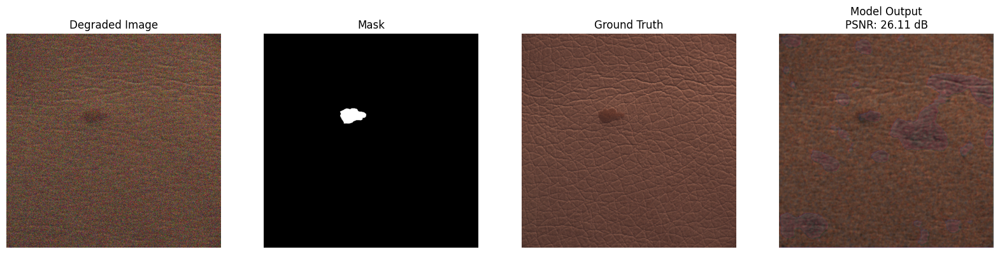

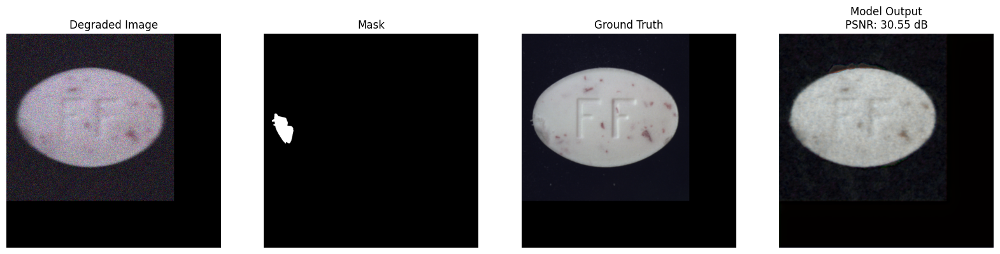

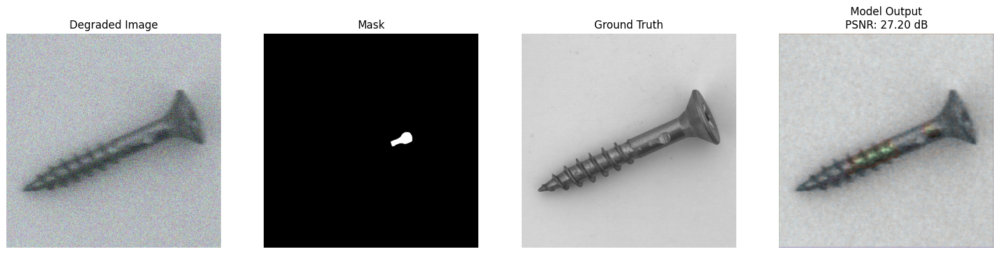

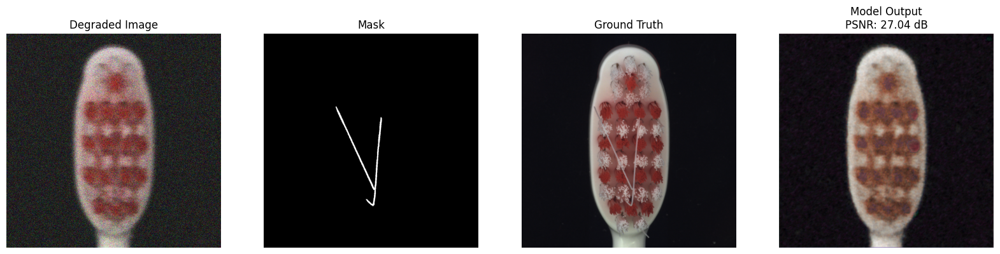

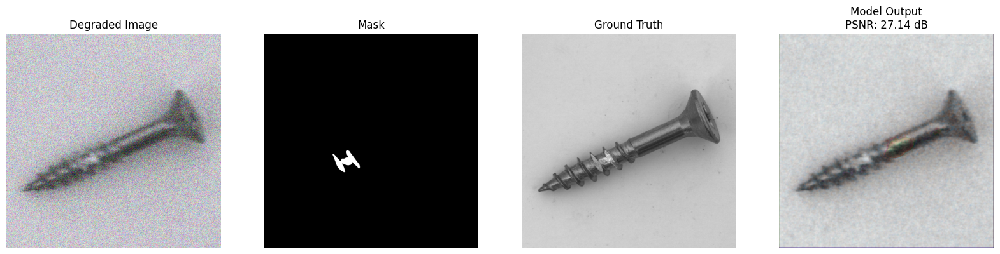

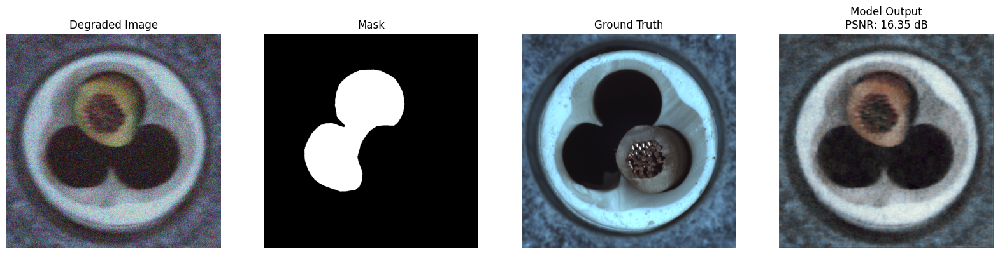

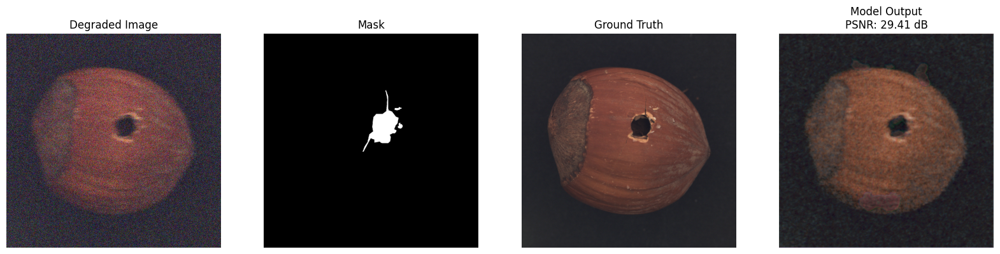

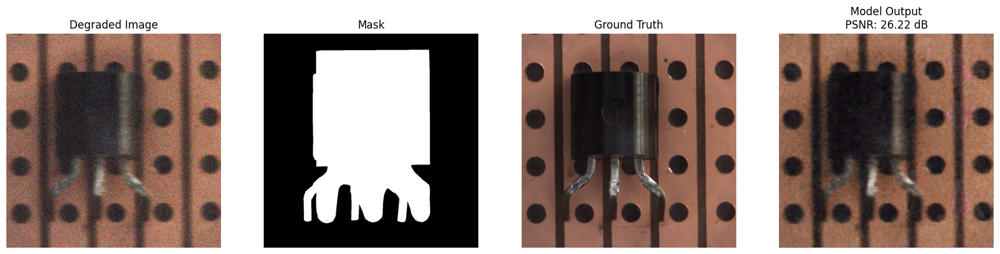

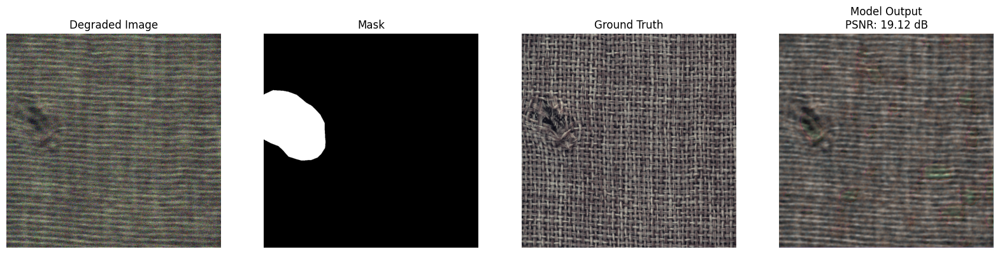

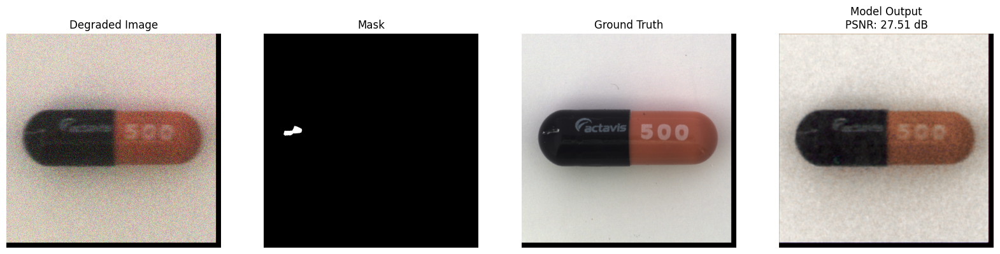

In [22]:
visualize_test_results(model=best_model, test_loader=test_loader, num_samples=10)


# MSE_resnet

In [17]:
# Choose encoder (ResNet or EfficientNet)
encoder_choice = 'resnet34'  # Options: 'resnet34', 'efficientnet-b0', 'efficientnet-b3', etc.
model = AttentionUNet(encoder_name=encoder_choice, pretrained=True).to(device)

# Freeze encoder layers (accessing the encoder through model.model.encoder)
for param in model.model.encoder.parameters():
    param.requires_grad = False


# Only train decoder and attention layers
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, weight_decay=1e-5)

# Learning Rate Scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Custom Weighted Loss
criterion = WeightedLoss(base_loss=nn.MSELoss(), weight_factor=0.8)

/root/miniconda3/envs/pytorch_gpu/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Loading checkpoint from epoch 12 (checkpoint_epoch_12.pth)...


/tmp/ipykernel_1052/263892627.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Resumed training from epoch 12

Epoch [13/20]


Training Epoch 13: 100%|██████████| 82/82 [39:24<00:00, 28.84s/batch, Loss=0.00351]


Epoch [13/20], Train Loss: 0.0052, Val Loss: 0.0037, PSNR: 24.45 dB

Epoch [14/20]


Training Epoch 14: 100%|██████████| 82/82 [42:00<00:00, 30.74s/batch, Loss=0.00553]


Epoch [14/20], Train Loss: 0.0052, Val Loss: 0.0040, PSNR: 24.19 dB

Epoch [15/20]


Training Epoch 15: 100%|██████████| 82/82 [42:09<00:00, 30.85s/batch, Loss=0.00358]


Epoch [15/20], Train Loss: 0.0047, Val Loss: 0.0038, PSNR: 24.41 dB

Epoch [16/20]


Training Epoch 16: 100%|██████████| 82/82 [42:10<00:00, 30.87s/batch, Loss=0.00657]


Epoch [16/20], Train Loss: 0.0046, Val Loss: 0.0039, PSNR: 24.30 dB

Epoch [17/20]


Training Epoch 17: 100%|██████████| 82/82 [42:10<00:00, 30.86s/batch, Loss=0.0108] 


Epoch [17/20], Train Loss: 0.0047, Val Loss: 0.0030, PSNR: 25.52 dB

Epoch [18/20]


Training Epoch 18: 100%|██████████| 82/82 [42:11<00:00, 30.87s/batch, Loss=0.00325]


Epoch [18/20], Train Loss: 0.0044, Val Loss: 0.0030, PSNR: 25.57 dB

Epoch [19/20]


Training Epoch 19: 100%|██████████| 82/82 [42:12<00:00, 30.88s/batch, Loss=0.0102] 


Epoch [19/20], Train Loss: 0.0043, Val Loss: 0.0030, PSNR: 25.54 dB

Epoch [20/20]


Training Epoch 20: 100%|██████████| 82/82 [42:09<00:00, 30.85s/batch, Loss=0.0019] 


Epoch [20/20], Train Loss: 0.0042, Val Loss: 0.0044, PSNR: 23.75 dB


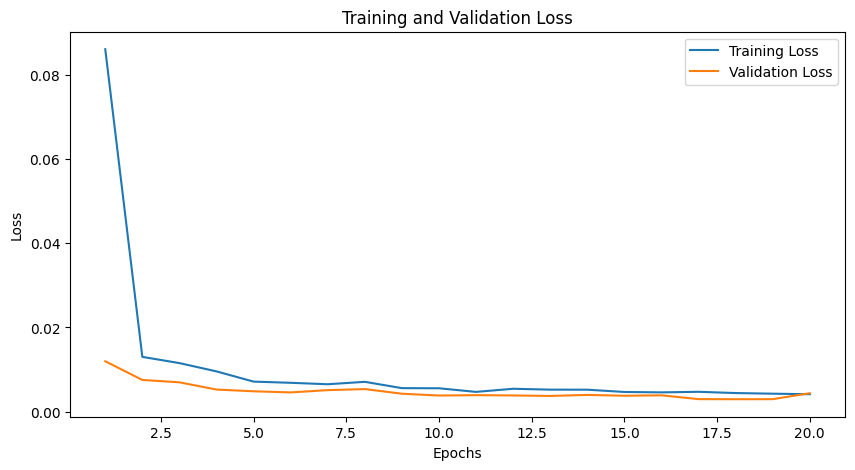

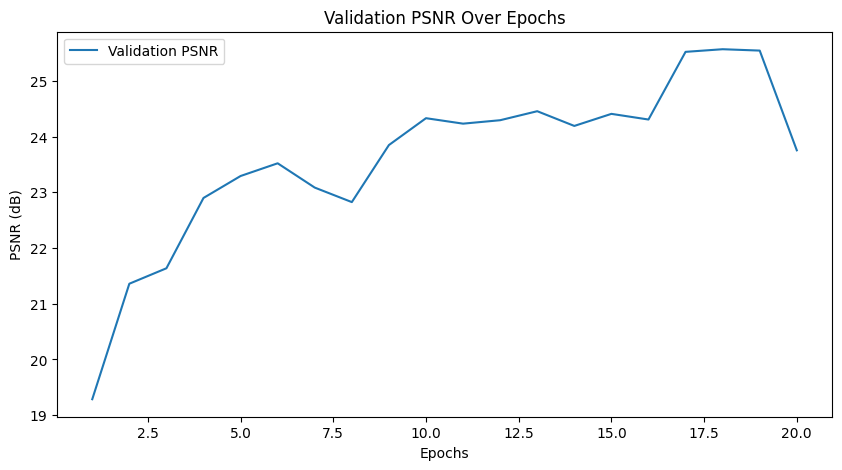

In [16]:
# Train the model
train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model_mse_resnet.pth', load_epoch=12)

In [22]:

# Define the directory and file for the checkpoint
checkpoint_dir = '/root/DWDP/Model'  # Update this path if the directory is different
checkpoint_file = 'checkpoint_epoch_18.pth'
checkpoint_path = os.path.join(checkpoint_dir, checkpoint_file)

# Check if the checkpoint file exists
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint file not found at {checkpoint_path}. Please verify the path.")

# Instantiate the model
best_model_resnet = AttentionUNet(encoder_name=encoder_choice, pretrained=False).to(device)

# Load the checkpoint
checkpoint = torch.load(checkpoint_path)

# Load only the model's state_dict
best_model_resnet.load_state_dict(checkpoint['model_state_dict'])
print("Model loaded successfully from:", checkpoint_path)

Model loaded successfully from: /root/DWDP/Model/checkpoint_epoch_18.pth


/tmp/ipykernel_116322/3372806128.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


/root/miniconda3/envs/pytorch_gpu/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(


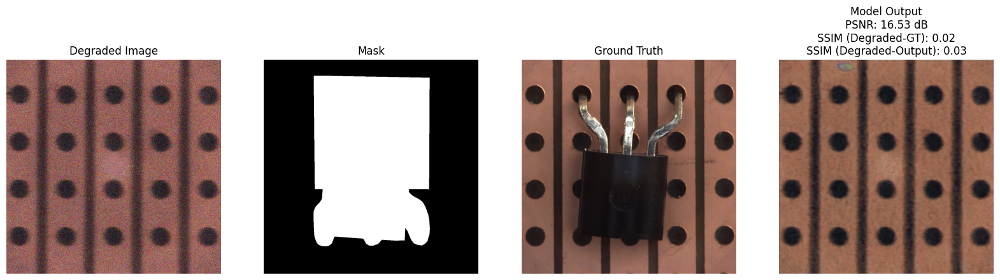

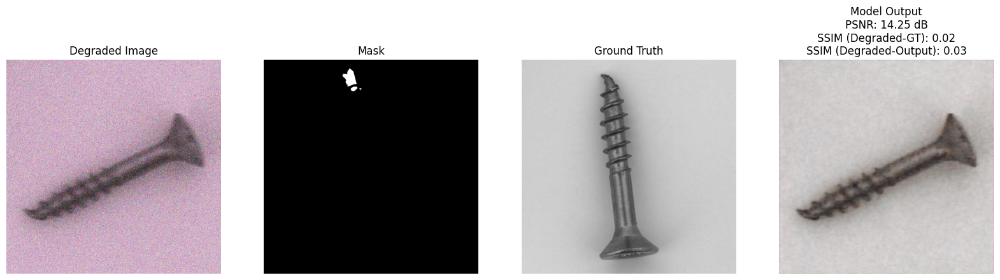

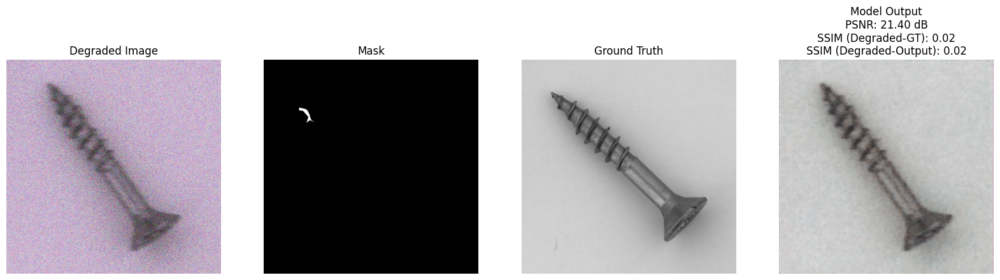

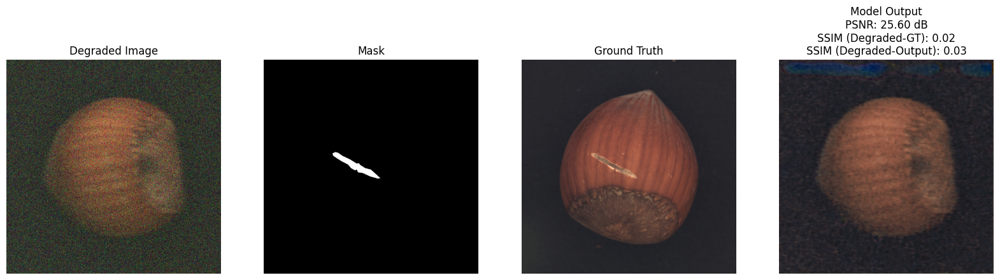

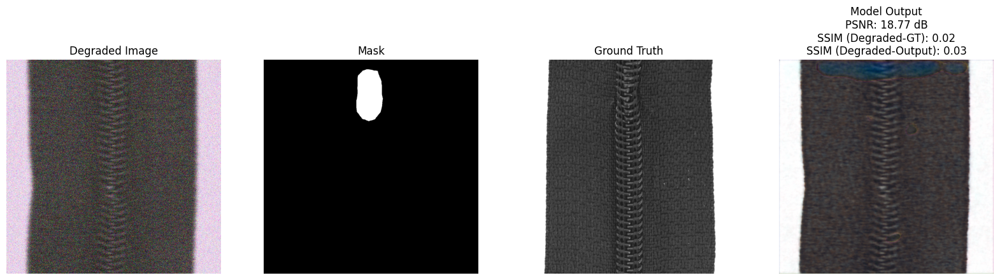

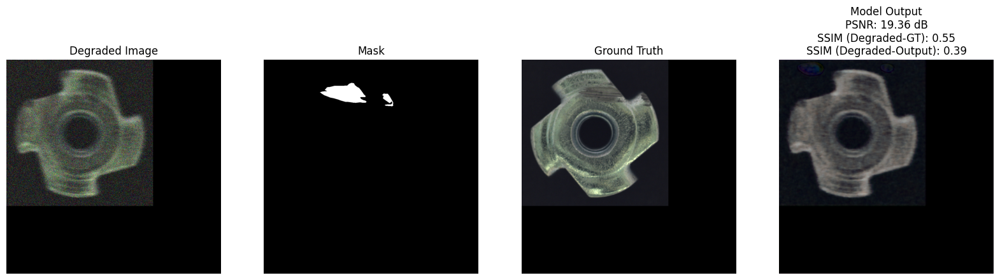

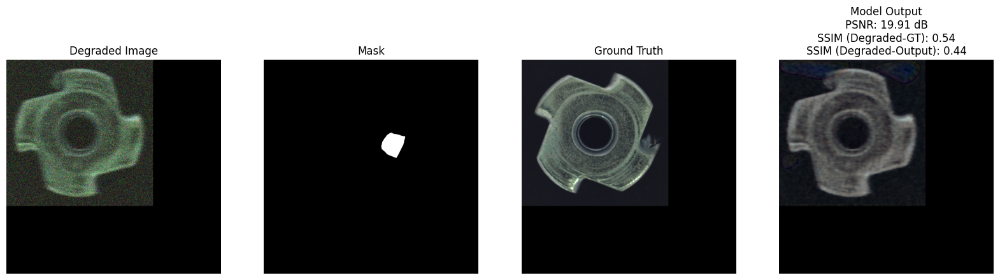

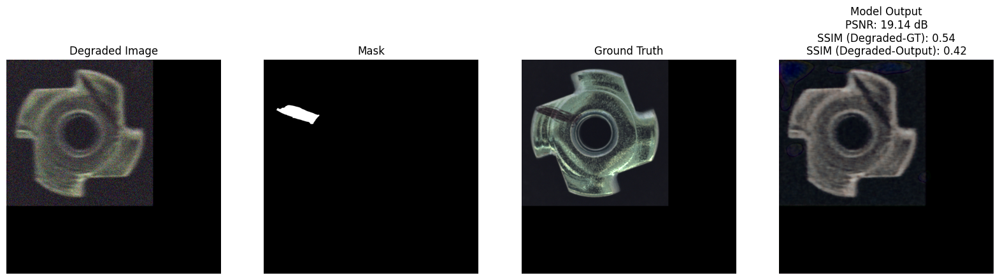

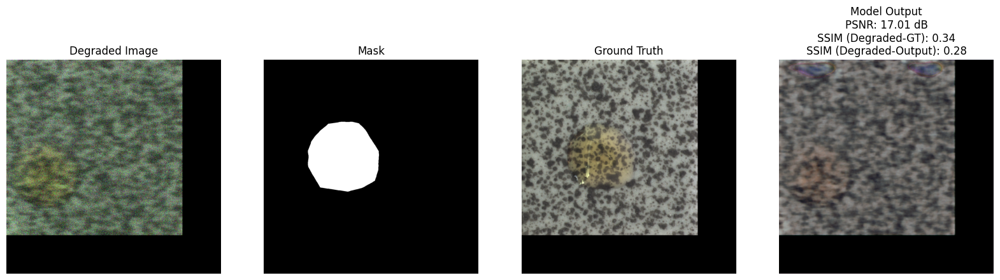

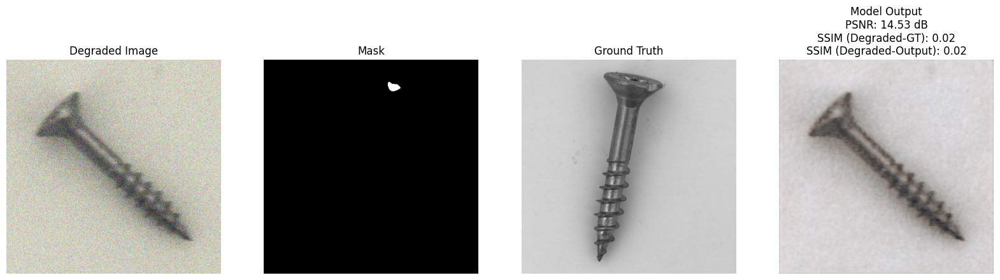

In [23]:
visualize_test_results(model=best_model_resnet, test_loader=test_loader, num_samples=10)


# MSE_SSIM_EFFNET

In [23]:
# Choose encoder (ResNet or EfficientNet)
encoder_choice = 'efficientnet-b3'  # Options: 'resnet34', 'efficientnet-b0', 'efficientnet-b3', etc.
model = AttentionUNet(encoder_name=encoder_choice, pretrained=True).to(device)

# Freeze encoder layers (accessing the encoder through model.model.encoder)
for param in model.model.encoder.parameters():
    param.requires_grad = False


# Only train decoder and attention layers
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, weight_decay=1e-5)

# Learning Rate Scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Custom Weighted Loss
criterion = WeightedLoss(base_loss=nn.MSELoss(), weight_factor=0.8)

In [24]:
from torchmetrics.functional import structural_similarity_index_measure as ssim

# Updated WeightedSSIMLoss Function with SSIM and Weighted MSE
class WeightedSSIMLoss(nn.Module):
    def __init__(self, weight_factor=0.8, alpha=0.5):
       
        super(WeightedSSIMLoss, self).__init__()
        self.weight_factor = weight_factor
        self.alpha = alpha

    def forward(self, output, target, mask):
        # SSIM loss: Higher SSIM means better quality, so we use (1 - SSIM) to minimize
        ssim_loss = 1 - ssim(output, target, data_range=1.0)

        # Weighted MSE loss: higher weight for the masked areas
        mse_loss = ((1 - mask) * (output - target) ** 2 + self.weight_factor * mask * (output - target) ** 2).mean()

        # Calculate a weighted combination of SSIM loss
        # Higher weight for the masked areas to focus on defect regions
        weighted_ssim_loss = (1 - mask) * ssim_loss + self.weight_factor * mask * ssim_loss

        # Combine SSIM and Weighted MSE losses
        combined_loss = self.alpha * weighted_ssim_loss.mean() + (1 - self.alpha) * mse_loss

        return combined_loss


In [18]:
# combined SSIM + Weighted MSE loss function
criterion = WeightedSSIMLoss(weight_factor=0.8, alpha=0.5)


In [20]:
train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model_ssim.pth', resume_training=False)



Epoch [1/20]


Training Epoch 1:   0%|          | 0/82 [00:00<?, ?batch/s]/root/miniconda3/envs/pytorch_gpu/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(
Training Epoch 1: 100%|██████████| 82/82 [38:56<00:00, 28.49s/batch, Loss=0.166]


Epoch [1/20], Train Loss: 0.3782, Val Loss: 0.2231, PSNR: 16.44 dB

Epoch [2/20]


Training Epoch 2: 100%|██████████| 82/82 [38:57<00:00, 28.51s/batch, Loss=0.194]


Epoch [2/20], Train Loss: 0.1923, Val Loss: 0.2242, PSNR: 16.71 dB

Epoch [3/20]


Training Epoch 3: 100%|██████████| 82/82 [39:20<00:00, 28.79s/batch, Loss=0.272]


Epoch [3/20], Train Loss: 0.1871, Val Loss: 0.1988, PSNR: 18.48 dB

Epoch [4/20]


Training Epoch 4: 100%|██████████| 82/82 [39:26<00:00, 28.86s/batch, Loss=0.164]


Epoch [4/20], Train Loss: 0.1701, Val Loss: 0.1696, PSNR: 21.63 dB

Epoch [5/20]


Training Epoch 5: 100%|██████████| 82/82 [39:17<00:00, 28.75s/batch, Loss=0.237] 


Epoch [5/20], Train Loss: 0.1570, Val Loss: 0.1675, PSNR: 20.20 dB

Epoch [6/20]


Training Epoch 6: 100%|██████████| 82/82 [39:35<00:00, 28.97s/batch, Loss=0.151] 


Epoch [6/20], Train Loss: 0.1479, Val Loss: 0.1458, PSNR: 21.56 dB

Epoch [7/20]


Training Epoch 7: 100%|██████████| 82/82 [39:34<00:00, 28.96s/batch, Loss=0.0741]


Epoch [7/20], Train Loss: 0.1285, Val Loss: 0.1289, PSNR: 22.67 dB

Epoch [8/20]


Training Epoch 8: 100%|██████████| 82/82 [39:39<00:00, 29.02s/batch, Loss=0.137] 


Epoch [8/20], Train Loss: 0.1207, Val Loss: 0.1345, PSNR: 19.57 dB

Epoch [9/20]


Training Epoch 9: 100%|██████████| 82/82 [39:46<00:00, 29.10s/batch, Loss=0.0864]


Epoch [9/20], Train Loss: 0.1222, Val Loss: 0.1278, PSNR: 21.92 dB

Epoch [10/20]


Training Epoch 10: 100%|██████████| 82/82 [38:13<00:00, 27.96s/batch, Loss=0.105] 


Epoch [10/20], Train Loss: 0.1160, Val Loss: 0.1253, PSNR: 22.89 dB

Epoch [11/20]


Training Epoch 11: 100%|██████████| 82/82 [38:00<00:00, 27.81s/batch, Loss=0.221] 


Epoch [11/20], Train Loss: 0.1331, Val Loss: 0.1316, PSNR: 22.30 dB

Epoch [12/20]


Training Epoch 12: 100%|██████████| 82/82 [38:11<00:00, 27.94s/batch, Loss=0.312] 


Epoch [12/20], Train Loss: 0.1301, Val Loss: 0.1281, PSNR: 22.40 dB

Epoch [13/20]


Training Epoch 13:  70%|██████▉   | 57/82 [26:47<11:44, 28.20s/batch, Loss=0.0935]


KeyboardInterrupt: 

In [26]:
# Load the saved checkpoint
checkpoint = torch.load('best_model_ssim.pth')

# Create the model instance
best_model_ssim_effnet = AttentionUNet(encoder_name=encoder_choice, pretrained=False).to(device)

# Load only the model weights
best_model_ssim_effnet.load_state_dict(checkpoint['model_state_dict'])


/tmp/ipykernel_197165/488580843.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('best_model_ssim.pth')


<All keys matched successfully>

In [ ]:
visualize_test_results(model=best_model_ssim_effnet, test_loader=test_loader, num_samples=10)


# Improvements in attention using Tranformers

## Description

### Updated Denoising Model Architecture with Transformer-Based Attention and SSIM Loss

### Changes in the Architecture

#### Transformer-Based Attention Block

The previous SCSE attention mechanism has been replaced with a **Transformer-based Attention Block**:

- **Multi-Head Self-Attention (MHSA)**:
  - Introduces a global context mechanism by using multiple heads to attend to different regions simultaneously.
  - Enhances the model’s ability to focus on important areas and capture dependencies between distant parts of the image.
  - This is crucial for identifying fine details that might otherwise be overlooked by traditional convolutional filters.
- **Feed-Forward Network**:
  - Applied after the MHSA to refine features extracted by the attention mechanism.
  - Increases the complexity and depth of feature learning, allowing the network to capture more intricate patterns.
- **Layer Normalization**:
  - Provides stability during training by normalizing the inputs to each layer.
  - Helps accelerate convergence and ensures consistent behavior throughout the learning process.

#### Modified U-Net Decoder with Transformer-Based Attention

The U-Net Decoder has been updated to incorporate the Transformer-based attention block:

- Each decoder block now uses Transformer-based attention, which involves:
  - Applying Multi-Head Self-Attention to capture global dependencies.
  - Enhancing features through a feed-forward network.
  - Incorporating normalization for improved stability.
- These changes allow the network to better preserve tiny, critical details during the upsampling process, which is essential for tasks like denoising.

#### New Loss Function: SSIM-Based Weighted Loss

The previous loss function, which relied on Mean Squared Error (MSE), has been replaced with a **SSIM-based Weighted Loss**:

- **SSIM Loss**:
  - The Structural Similarity Index (SSIM) is used to measure the similarity between the denoised image and the ground truth.
  - SSIM is more sensitive to human perception, focusing on structural and perceptual quality rather than just pixel-level differences.
  - The loss is defined as `1 - SSIM`, where a higher SSIM indicates better quality.
- **Weighted SSIM**:
  - The SSIM loss is adjusted to give higher weight to regions defined by the defect mask.
  - This ensures that critical defect areas are given more importance during training, helping to maintain high-quality restoration in these regions.

### Advantages of the Changes

- **Global Context from MHSA**:
  - The Multi-Head Self-Attention captures relationships across the entire image, not limited to local regions.
  - This results in a better understanding of the image’s spatial dependencies, essential for effective denoising.
  - The global context allows for a more coherent reconstruction of the image, especially when dealing with complex noise patterns.

- **Perceptual Quality with SSIM Loss**:
  - SSIM is tailored to preserve the structural integrity and visual quality of the images, making it ideal for denoising.
  - By focusing on perceptual similarity, the model is better equipped to avoid common artifacts introduced by pixel-wise loss functions like MSE.
  - This leads to visually superior outputs, particularly in scenarios involving subtle details and small defects.

### References

1. **Multi-Head Self-Attention**:
   - Vaswani, A., et al. (2017). *Attention Is All You Need*. In Advances in Neural Information Processing Systems (NIPS).

2. **SSIM Loss**:
   - Wang, Z., Bovik, A. C., Sheikh, H. R., & Simoncelli, E. P. (2004). *Image Quality Assessment: From Error Visibility to Structural Similarity*. IEEE Transactions on Image Processing.

3. **U-Net Architecture**:
   - Ronneberger, O., Fischer, P., & Brox, T. (2015). *U-Net: Convolutional Networks for Biomedical Image Segmentation*. In Medical Image Computing and Computer-Assisted Intervention (MICCAI).



## Implimentation

In [ ]:
import torch.nn.functional as F
from torch.nn import MultiheadAttention

# Transformer-Based Attention Block
class TransformerAttentionBlock(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.1):
        super(TransformerAttentionBlock, self).__init__()
        self.in_channels = in_channels
        self.num_heads = num_heads

        # Multi-Head Self-Attention
        self.multihead_attn = MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout)
        self.norm1 = nn.LayerNorm(in_channels)
        self.norm2 = nn.LayerNorm(in_channels)

        # Feed-forward network
        self.feed_forward = nn.Sequential(
            nn.Linear(in_channels, in_channels * 4),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(in_channels * 4, in_channels)
        )

    def forward(self, x):
        # Reshape for multi-head attention: (Batch, Channels, Height, Width) -> (Height*Width, Batch, Channels)
        batch_size, channels, height, width = x.size()
        x = x.flatten(2).transpose(0, 2).contiguous()

        # Apply Multi-Head Attention
        attn_output, _ = self.multihead_attn(x, x, x)
        x = self.norm1(x + attn_output)

        # Feed-Forward Network
        ff_output = self.feed_forward(x)
        x = self.norm2(x + ff_output)

        # Reshape back: (Height*Width, Batch, Channels) -> (Batch, Channels, Height, Width)
        x = x.transpose(0, 2).contiguous().view(batch_size, channels, height, width)
        return x


In [ ]:
# Example modification of a decoder block to use Transformer-based attention
class AttentionUNetWithTransformer(nn.Module):
    def __init__(self, encoder_name='resnet34', pretrained=True, num_heads=4):
        super(AttentionUNetWithTransformer, self).__init__()
        # Use a pre-trained encoder
        self.encoder = smp.encoders.get_encoder(
            encoder_name, 
            in_channels=3, 
            depth=5,
            weights="imagenet" if pretrained else None
        )
        
        # Decoder part for U-Net with Transformer Attention
        self.decoder = nn.ModuleList([
            nn.Sequential(
                smp.decoders.unet.decoder.DecoderBlock(
                    in_channels=self.encoder.out_channels[i], 
                    out_channels=(256, 128, 64, 32, 16)[i],
                    use_batchnorm=True
                ),
                TransformerAttentionBlock(in_channels=(256, 128, 64, 32, 16)[i], num_heads=num_heads)
            )
            for i in range(5)
        ])
        
        # Final convolution layer to produce the denoised output
        self.final_conv = nn.Conv2d(16, 3, kernel_size=(1, 1))
        
    def forward(self, x):
        # Encoder
        features = self.encoder(x)
        
        # Decoder with transformer-based attention
        x = features[0]
        for i in range(1, len(features)):
            x = self.decoder[i - 1](x + features[i])  # Using skip connections
        
        # Final convolution to produce output image
        x = self.final_conv(x)
        return x


In [ ]:
model = AttentionUNetWithTransformer(encoder_name='resnet34', pretrained=True, num_heads=4).to(device)


In [ ]:
# Initialize the criterion with the new SSIM-based loss
criterion = WeightedSSIMLoss(weight_factor=0.8)


In [ ]:
train_and_evaluate(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs=20, save_path='best_model_ssim_trans.pth')

In [ ]:
# Visualize test results after testing
visualize_test_results(model=best_mode_ssim_trans.pth, test_loader, num_samples=5)

# Compare 

In [ ]:
import torchsummary  # For model summaries
import numpy as np

# Function to compare multiple models based on PSNR and visual inspection
def compare_models(models, model_names, test_loader, num_samples=5):
    """
    Compare multiple models based on PSNR and visual inspection.
    
    Args:
    - models (list): List of models to compare.
    - model_names (list): List of model names (strings).
    - test_loader (DataLoader): Test dataset DataLoader.
    - num_samples (int): Number of test samples to visualize.
    """
    
    # Ensure the number of models and model names match
    assert len(models) == len(model_names), "Number of models and names must match!"
    
    # Initialize a dictionary to store PSNR results
    psnr_results = {}
    
    for i, model in enumerate(models):
        # Move model to the correct device
        model.to(device)
        model.eval()

        # Display model summary
        print(f"\n### Model Summary for {model_names[i]} ###")
        torchsummary.summary(model, input_size=(3, 256, 256))  # Adjust input size if needed
        
        # Calculate PSNR for this model
        psnr_total = 0.0
        num_batches = 0
        with torch.no_grad():
            for degraded_img, mask, ground_truth in test_loader:
                degraded_img, ground_truth = degraded_img.to(device), ground_truth.to(device)
                
                # Get model output
                output = model(degraded_img)
                
                # Compute PSNR for the batch
                for j in range(degraded_img.size(0)):
                    psnr_value = calculate_psnr(output[j], ground_truth[j])
                    psnr_total += psnr_value
                
                num_batches += 1

            # Calculate average PSNR
            avg_psnr = psnr_total / num_batches
            psnr_results[model_names[i]] = avg_psnr
            print(f"Average PSNR for {model_names[i]}: {avg_psnr:.2f} dB")
    
    # Display PSNR Comparison
    print("\n### PSNR Comparison ###")
    for name, psnr in psnr_results.items():
        print(f"{name}: {psnr:.2f} dB")
    
    # Visualize Test Samples for Each Model
    for i, model in enumerate(models):
        model.eval()
        samples_visualized = 0
        print(f"\nVisualizing results for {model_names[i]}:")
        
        with torch.no_grad():
            for degraded_img, mask, ground_truth in test_loader:
                degraded_img, ground_truth = degraded_img.to(device), ground_truth.to(device)
                output = model(degraded_img)
                
                # Visualize the first num_samples test results
                for j in range(degraded_img.size(0)):
                    if samples_visualized < num_samples:
                        psnr_value = calculate_psnr(output[j], ground_truth[j])

                        # Convert tensors to NumPy arrays for visualization
                        degraded_np = degraded_img[j].cpu().numpy().transpose(1, 2, 0)
                        ground_truth_np = ground_truth[j].cpu().numpy().transpose(1, 2, 0)
                        output_np = output[j].cpu().numpy().transpose(1, 2, 0)

                        # Visualize results
                        plt.figure(figsize=(20, 5))
                        plt.subplot(1, 3, 1)
                        plt.imshow(np.clip(degraded_np, 0, 1))
                        plt.title('Degraded Image')
                        plt.axis('off')

                        plt.subplot(1, 3, 2)
                        plt.imshow(np.clip(output_np, 0, 1))
                        plt.title(f'{model_names[i]} Output\nPSNR: {psnr_value:.2f} dB')
                        plt.axis('off')

                        plt.subplot(1, 3, 3)
                        plt.imshow(np.clip(ground_truth_np, 0, 1))
                        plt.title('Ground Truth')
                        plt.axis('off')

                        plt.show()

                        samples_visualized += 1
                    else:
                        break


In [ ]:
baseline_model = AttentionUNet(encoder_name='resnet34', pretrained=True)
transformer_model = AttentionUNetWithTransformer(encoder_name='resnet34', pretrained=True, num_heads=4)


In [ ]:
baseline_model.load_state_dict(torch.load('baseline_model.pth'))
transformer_model.load_state_dict(torch.load('transformer_model.pth'))


In [ ]:
models = [baseline_model, transformer_model]
model_names = ['Baseline U-Net with SCSE', 'U-Net with Transformer Attention']

compare_models(models, model_names, test_loader, num_samples=5)


# Test your data